In [1]:
%load_ext autoreload
%autoreload 2

# Simple Regression Tests


In [2]:
import os
import sys
from pathlib import Path

# add the
ROOT = Path(os.getcwd())
while not (ROOT / ".git").exists():
    ROOT = ROOT.parent

sys.path.append(str(ROOT))

from src.config import CargoBikeConfig, load_config
from src.osm_tags import build_tag_filter


import polars as pl
import geopolars as gpl
import geopandas as gpd
import pandas as pd

## Load and do TSNE on the Embeddings

In [3]:
config = load_config(ROOT / "config" / "paper.yaml")

h3_df = pd.concat(
    [gpd.read_parquet(city.h3_file).assign(city=city.name) for city in config.Cities],
    axis=0,
).query("is_city")

h3_df.head()

,geometry,is_city,city
region_id,,,
892a339a5afffff,"POLYGON ((-71.13572 42.23376, -71.13794 42.232...",True,"Boston, USA"
892a3066a3bffff,"POLYGON ((-71.08114 42.30902, -71.08337 42.308...",True,"Boston, USA"
892a302a567ffff,"POLYGON ((-70.82381 42.36269, -70.82604 42.361...",True,"Boston, USA"
892a3066e17ffff,"POLYGON ((-71.06072 42.33323, -71.06295 42.332...",True,"Boston, USA"
892a3066b3bffff,"POLYGON ((-71.06614 42.29023, -71.06837 42.289...",True,"Boston, USA"


In [4]:
embedding_files = list((ROOT / "data" / "geovex").glob("embeddings*parquet"))
embedding_files

[PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_validation_stop.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_100_epochs_shuffled.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_shuffled.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_500_randomized.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_3_layers.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_validation_stop_no_shuffle.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_cropped.parquet'),
 PosixPath('/Users/max/Development/green-last-mile/cargo

In [5]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def tsne(df) -> pd.DataFrame:
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)

    tsne_results = tsne.fit_transform(df)

    tsne_df = pd.DataFrame(tsne_results, index=df.index, columns=["x", "y"])

    tsne_df = tsne_df.join(h3_df[["city"]])

    return tsne_df
# do tsne

def plot_tsne(tsne_df):

    fig, ax = plt.subplots(figsize=(10, 10))

    for city, df in tsne_df.groupby("city"):
        ax.scatter(df["x"], df["y"], label=city, alpha=0.3)

    ax.legend()

    return fig, ax

/Users/max/Development/green-last-mile/cargo-bike-analysis/data/geovex/embeddings_validation_stop.parquet
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 29535 samples in 0.004s...
[t-SNE] Computed neighbors for 29535 samples in 1.397s...
[t-SNE] Computed conditional probabilities for sample 1000 / 29535
[t-SNE] Computed conditional probabilities for sample 2000 / 29535
[t-SNE] Computed conditional probabilities for sample 3000 / 29535
[t-SNE] Computed conditional probabilities for sample 4000 / 29535
[t-SNE] Computed conditional probabilities for sample 5000 / 29535
[t-SNE] Computed conditional probabilities for sample 6000 / 29535
[t-SNE] Computed conditional probabilities for sample 7000 / 29535
[t-SNE] Computed conditional probabilities for sample 8000 / 29535
[t-SNE] Computed conditional probabilities for sample 9000 / 29535
[t-SNE] Computed conditional probabilities for sample 10000 / 29535
[t-SNE] Computed conditional probabilities for sample 11000 / 29535
[t-SNE] Com

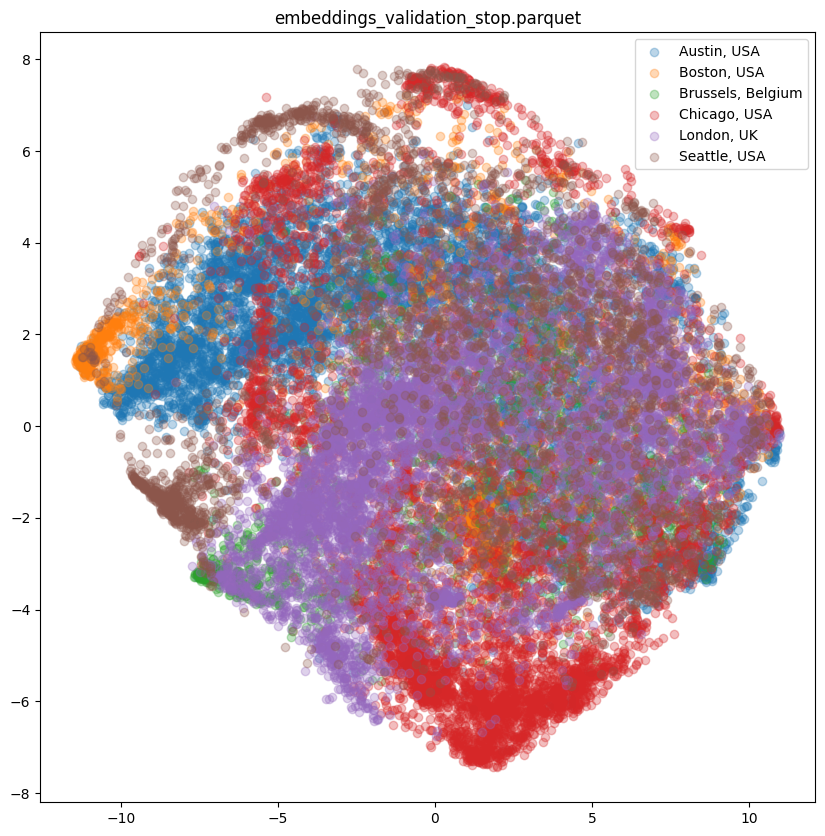

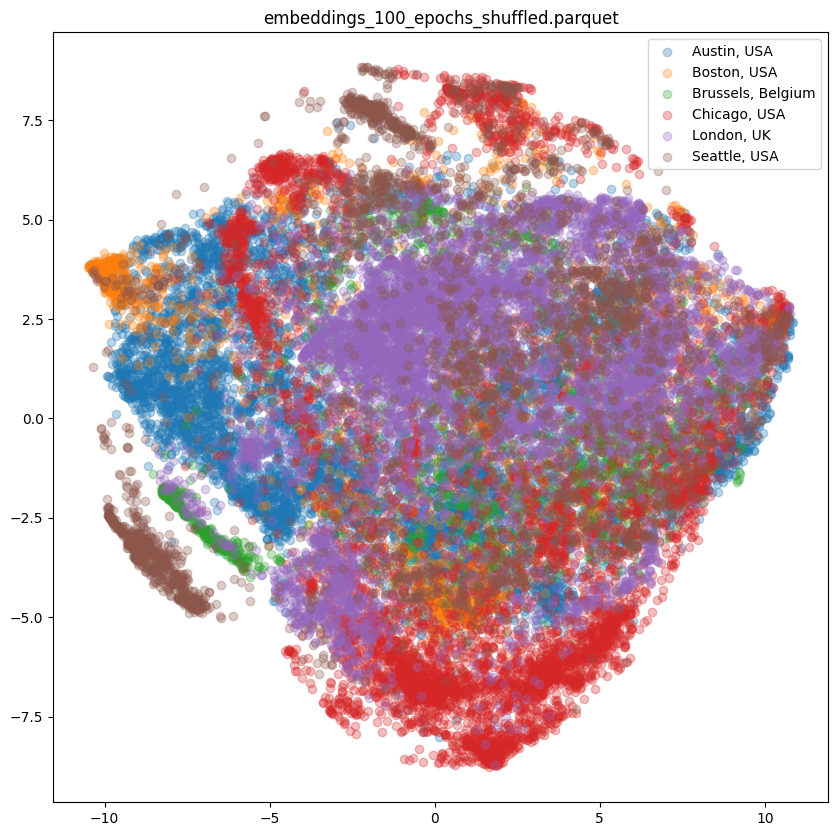

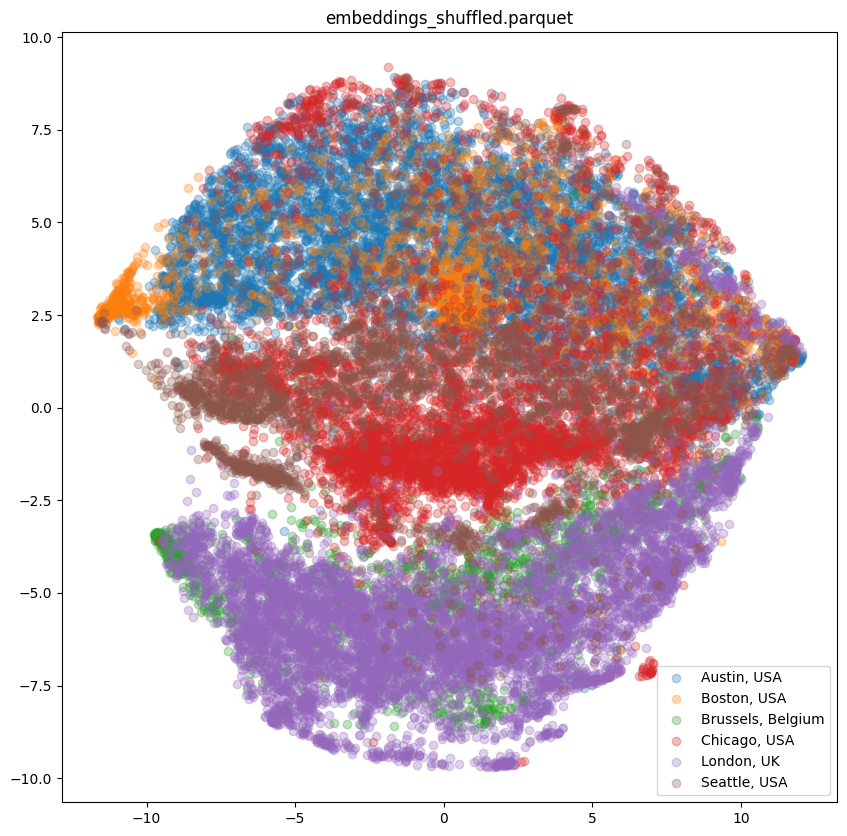

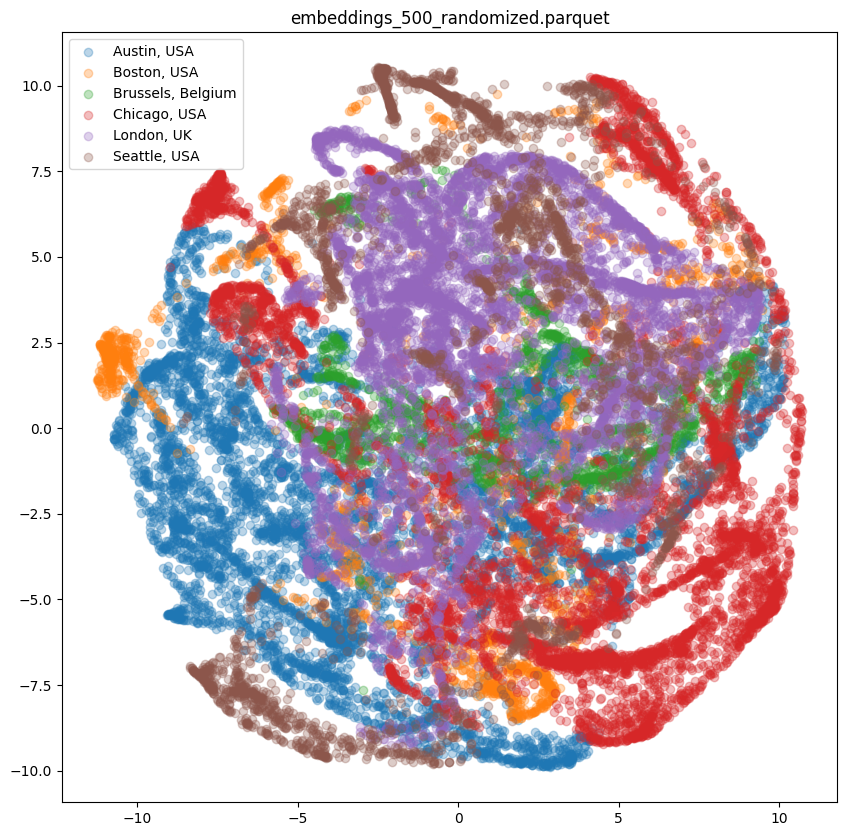

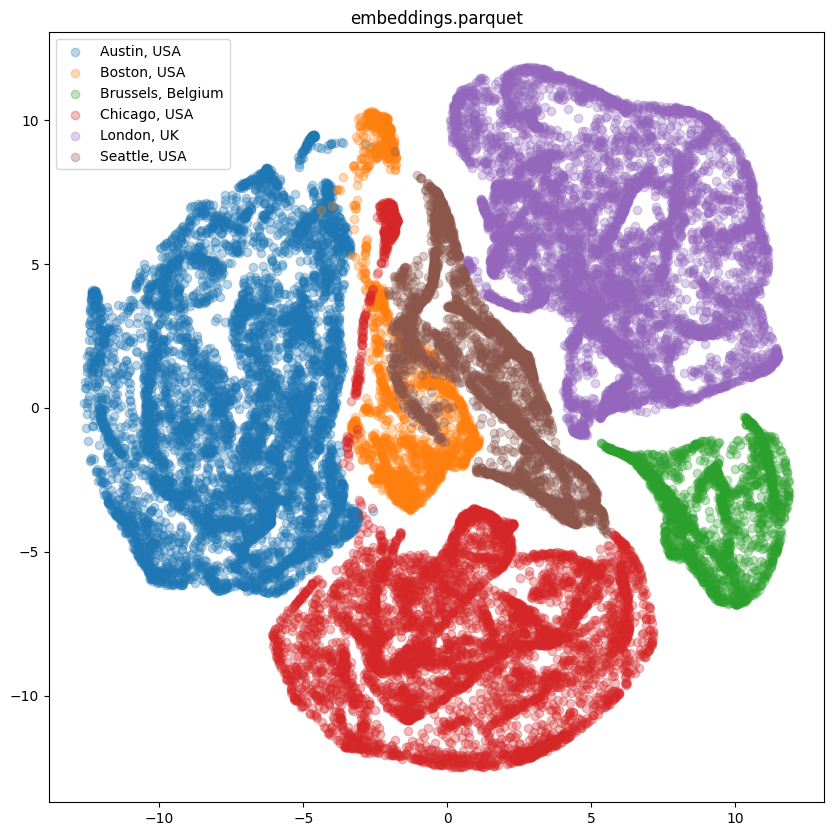

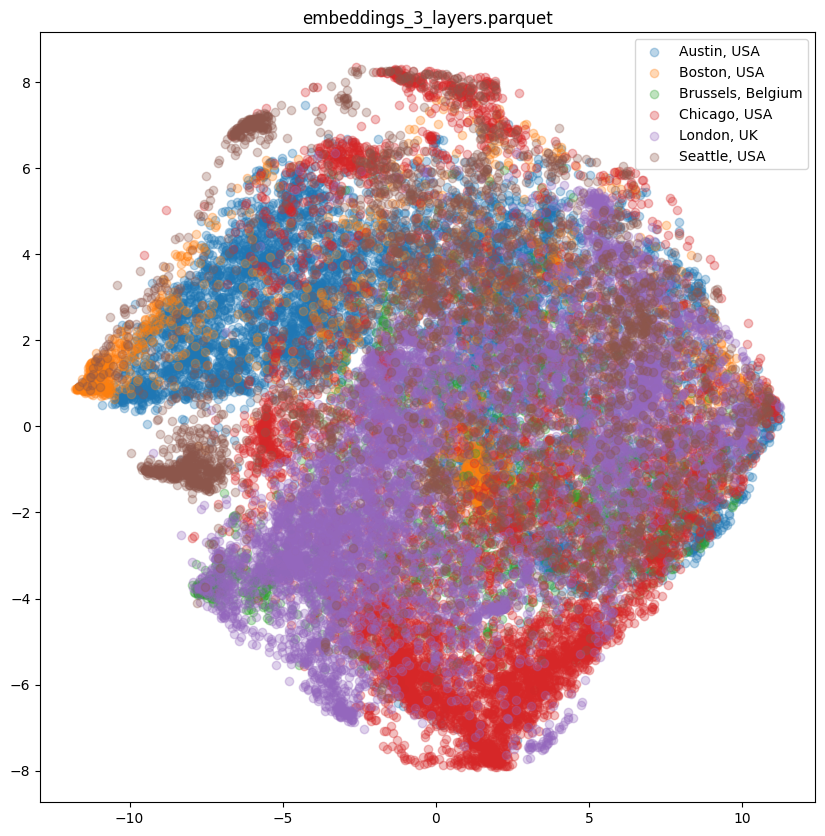

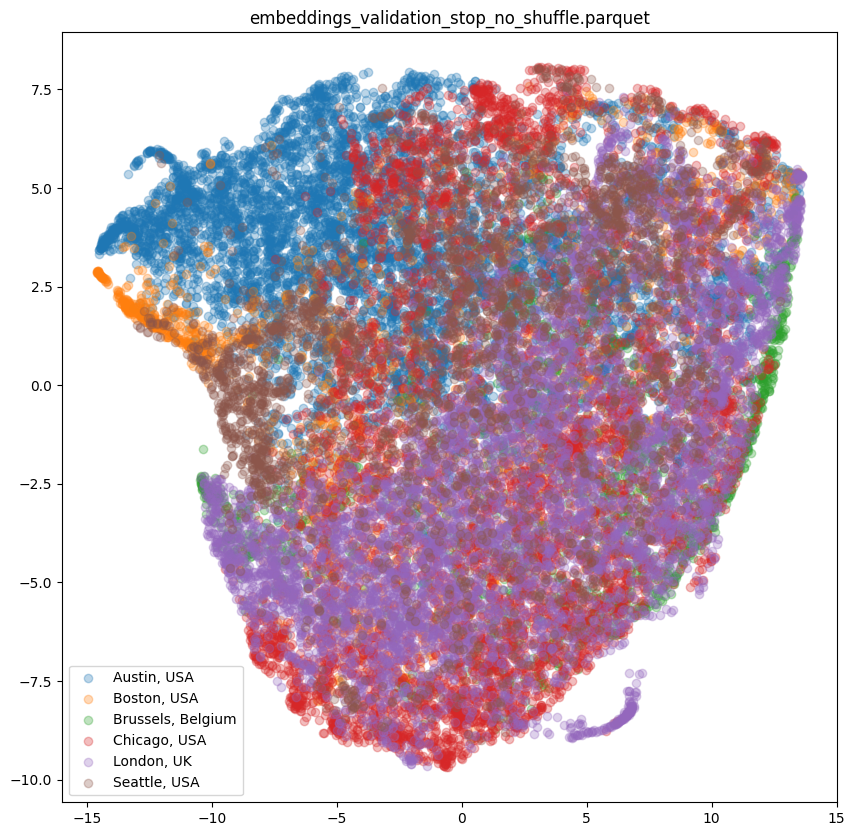

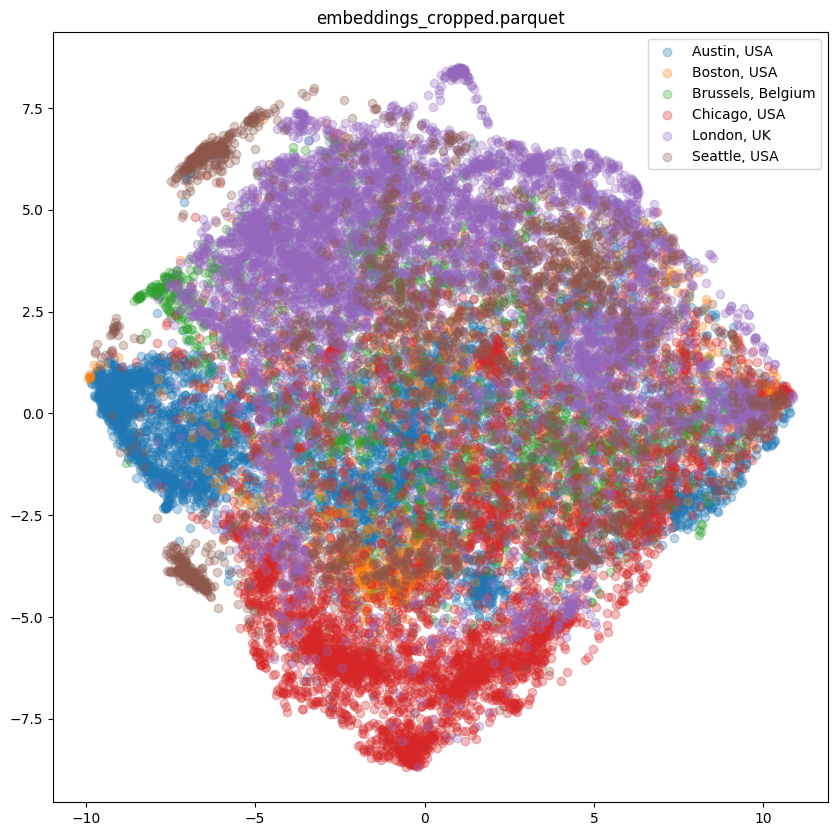

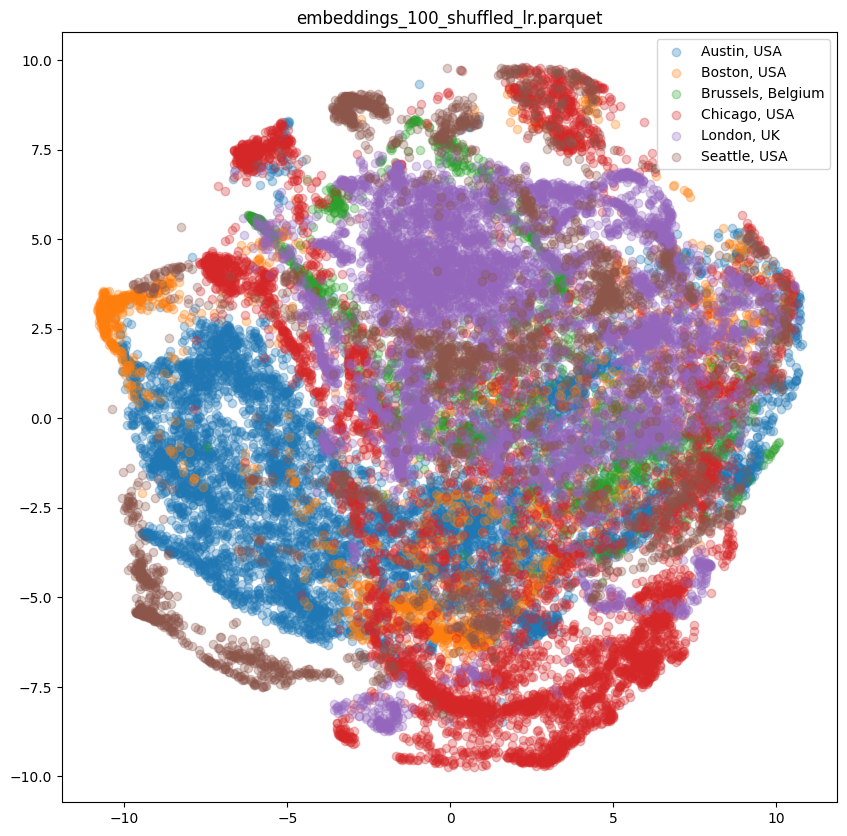

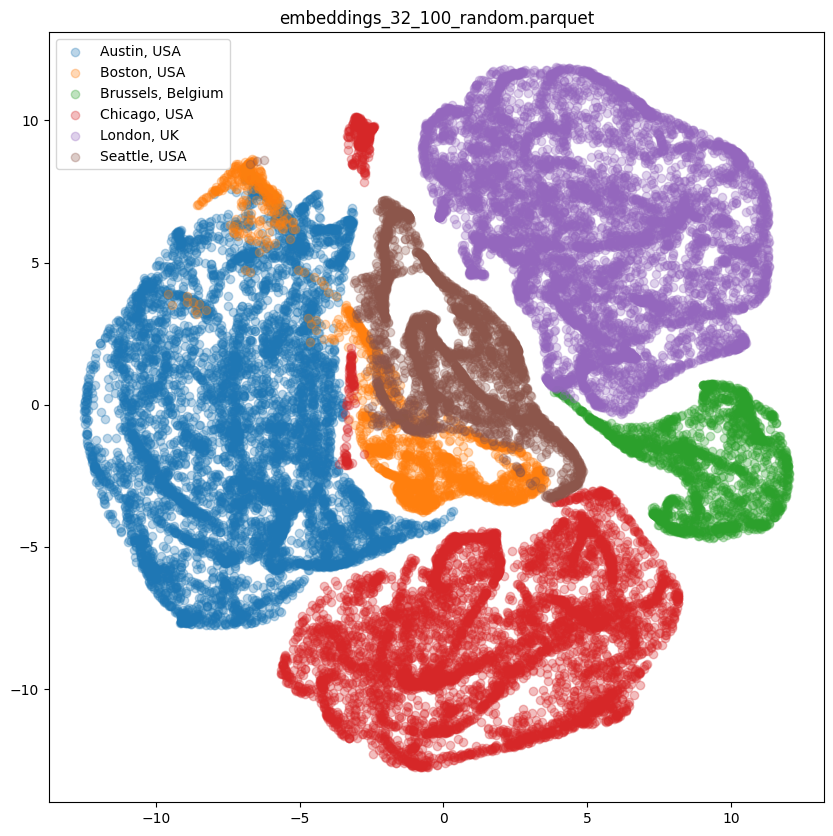

In [6]:
for embedding_file in embedding_files:
    print(embedding_file)
    embeddings = pl.read_parquet(embedding_file).to_pandas().set_index("region_id")

    tsne_df = tsne(embeddings)

    fig, ax = plot_tsne(tsne_df)

    # set the title to the embedding file name
    ax.set_title(embedding_file.name)
    
    

In [7]:
embeddings

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
region_id,,,,,,,,,,,,,,,,,,,,,
892a339a5afffff,-9.087200,0.879608,-1.621691,-25.087349,-6.752052,-7.529531,-20.429081,12.546949,21.886095,-20.286121,...,-7.162097,15.020052,8.935888,-12.309255,-27.974497,-9.475520,13.384890,36.458393,-39.854149,2.111859
892a3066a3bffff,8.160382,-15.603018,14.981820,-26.469828,10.111295,21.553419,-12.635017,2.886364,13.387370,-23.930655,...,6.092106,25.527227,-11.521547,-16.841282,-17.111128,6.346337,-7.460012,14.436222,-12.045622,12.079710
892a3066e17ffff,23.034849,22.091034,-27.583305,-38.063255,-2.733379,15.565284,-4.265275,11.578658,18.877901,-11.999786,...,18.755215,24.526403,-16.183456,-4.449495,-9.079720,36.129482,-14.957009,28.198593,-26.842196,-5.885256
892a3066b3bffff,-6.802660,-3.894132,22.829069,-23.759098,9.153341,4.746855,-19.351671,19.070427,17.260773,-27.121702,...,5.543098,16.805780,-7.513668,1.183753,-29.867521,4.652272,9.788146,23.105604,-20.644207,19.320509
892a3066803ffff,-28.848785,15.645265,-12.008562,-40.666267,-22.570295,-5.927393,-41.017982,18.980188,30.193689,-2.227997,...,3.276255,5.128973,-3.266136,-19.539871,-3.512694,17.237703,11.939430,33.901150,-36.700760,-19.969048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891fa44f4dbffff,33.779743,-11.264153,38.287376,-18.558372,21.338430,-16.822622,43.323059,26.899759,21.662125,-28.049541,...,17.415163,3.685783,-34.384785,-21.808365,3.094286,16.716337,-9.664012,5.181902,-19.909475,37.371433
891fa44060fffff,-10.063559,-24.357056,-13.135438,-5.921531,-27.864611,-27.767427,-7.864227,5.451704,16.520582,-14.000102,...,17.705376,15.424943,-42.228188,-9.039342,6.653362,25.492342,21.097433,36.506214,-42.045338,9.510532
891fa441b9bffff,47.530632,16.158152,-10.523749,-8.843138,16.839012,11.422565,41.829082,49.154434,26.519230,-57.964310,...,43.772434,8.823305,-46.240601,-20.988680,32.670254,33.673981,-18.052757,-10.878078,1.366108,-36.844391
